In [1]:
library(qs)
library(Seurat)
library(ggplot2)
library(patchwork)
library(dplyr)
library(tidyr)

qs 0.26.3

Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built under R 4.3.1 but the current version is
4.3.3; it is recomended that you reinstall ‘SeuratObject’ as the ABI
for R may have changed


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




## Load the atlas

In [6]:
atlas <- qread("/fs/scratch/PAS2694/iaradsouza1/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



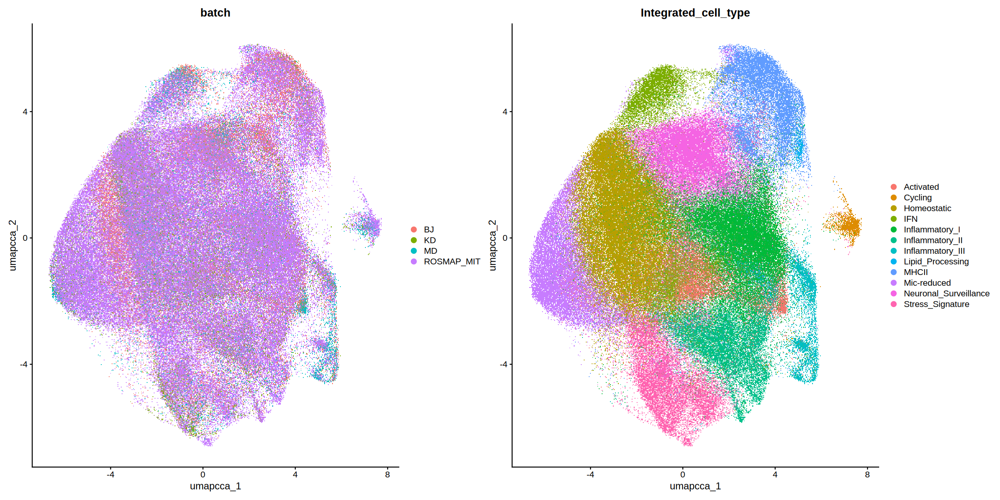

In [7]:
options(repr.plot.width = 20, repr.plot.height = 10)
DimPlot(atlas, group.by = c("batch", "Integrated_cell_type"), reduction = "umap.cca")

## Load the 13 sample and reset the image slot

In [17]:
s13 <- readRDS("~/projects_link/ST_micro/c2l_res/nAD/GSM8184313_only_neurons.rds")
img <- Read10X_Image("data/ST_AN1792_GSE263034/GSM8184313/spatial/", image.name = "tissue_hires_image.png")
DefaultAssay(img) <- "Spatial"
common <- intersect(colnames(s13), rownames(img@coordinates))
s13 <- s13[, common]
img <- img[common, ]
s13[["GSM8184313"]] <- img
#s13 <- subset(s13, region %in% c("Internal", "External"))

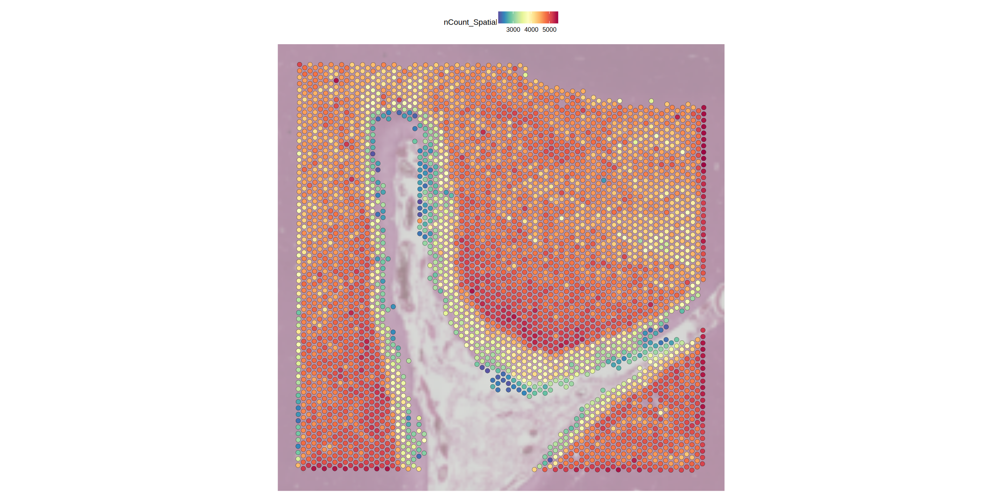

In [9]:
SpatialFeaturePlot(s13, features = "nCount_Spatial", pt.size.factor = 3, image.alpha = 0.5)

In [18]:
s13 <- SCTransform(s13, assay = "Spatial", method = "poisson")

Running SCTransform on assay: Spatial

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Variance stabilizing transformation of count matrix of size 17981 by 4265

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 4265 cells

Second step: Get residuals using fitted parameters for 17981 genes

Computing corrected count matrix for 17981 genes

Calculating gene attributes

Wall clock passed: Time difference of 22.34924 secs

Determine variable features

Centering data matrix

Set default assay to SCT



In [19]:
s13 <- s13 %>% 
    RunPCA() %>% 
    FindNeighbors(reduction = "pca", dims = 1:12) %>%
    FindClusters(resolution = 0.8) %>%
    RunUMAP(dims = 1:12)

PC_ 1 
Positive:  FRAS1, DCC, CCDC175, HS3ST2, MIS18A, RXFP1, C1QL2, OXLD1, TACC3, TMIE 
	   DCAF13, RIIAD1, PRPF40B, RLIM, PCDHB3, ISLR2, COQ6, ZNF682, ADRA2A, ZBTB9 
	   CYB561D2, ZNF625, ZNF253, ZNF224, KLRG1, CENPBD1, CCDC68, MAGIX, C12orf66, C3orf18 
Negative:  SPARC, FOS, AEBP1, AHNAK, CXCL14, ADAMTS1, CD74, ZFP36, SOCS3, IFITM3 
	   TPM2, YBX3, BST2, DCN, GADD45B, ZFP36L1, FN1, ADIRF, CLIC4, RNASE1 
	   TXNIP, ADAMTS9, IFI16, NR2F2, STOM, ZFP36L2, A2M, PRELP, SRGN, C1QA 
PC_ 2 
Positive:  MOBP, AQP1, CERCAM, TF, ERMN, TMEM144, KLK6, NKX6-2, PAIP2B, ENPP2 
	   ST18, CAPN3, TP53INP2, MYRF, ASPA, FGF1, MOG, TMEM63A, UGT8, ANLN 
	   SFRP1, PCSK6, TMEM235, BOK, PLLP, TTYH2, DAAM2, PAQR6, CNDP1, HS3ST4 
Negative:  PRELP, C1S, DCN, FN1, NOTCH3, TPM2, SERPING1, IFI27, ENG, IGFBP4 
	   EPS8, ITIH5, CNN2, LIMS2, NNMT, SP100, NR2F2, FSTL1, TNXB, IGFBP7 
	   IFITM3, DUSP1, TM4SF1, FLNA, PHACTR2, ADAMTS1, COL4A2, LRRC32, SOD3, ADIRF 
PC_ 3 
Positive:  CXCL14, CALB2, C1QL2, RGS12, C3, PROX1, 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4265
Number of edges: 147903

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7322
Number of communities: 7
Elapsed time: 0 seconds


15:06:52 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

15:06:52 Read 4265 rows and found 12 numeric columns

15:06:52 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

15:06:52 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:06:53 Writing NN index file to temp file /tmp/slurmtmp.42076561/RtmpbS4PRH/file272582d5dbdb2

15:06:53 Searching Annoy index using 1 thread, search_k = 3000

15:06:54 Annoy recall = 100%

15:06:55 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:06:56 Initializing from norma

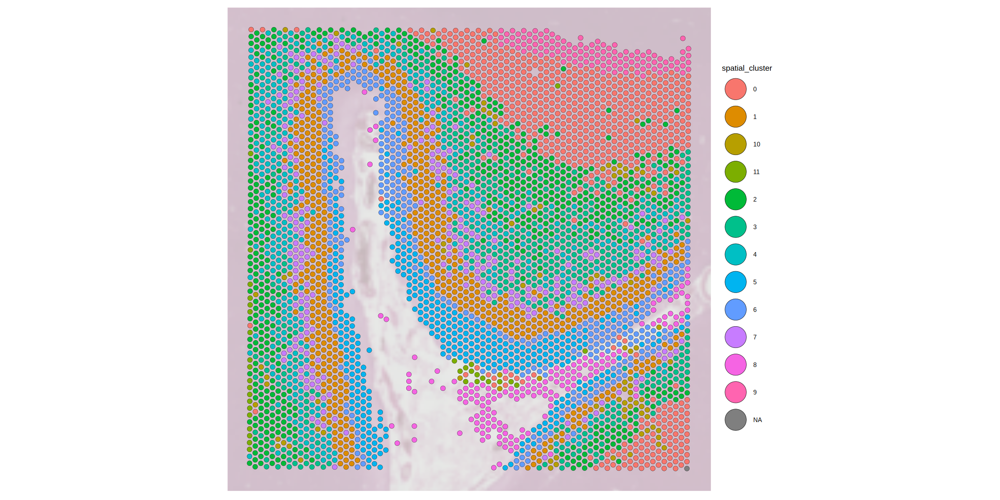

In [41]:
SpatialPlot(s13, group.by = "spatial_cluster", pt.size.factor = 3, image.alpha = 0.3) + guides(fill = guide_legend(override.aes = list(size=14)))

In [30]:
Idents(s13) <- "spatial_cluster"

In [32]:
df <- FindAllMarkers(s13, only.pos = T)

Calculating cluster 9

Calculating cluster 2

Calculating cluster 1

Calculating cluster 3

Calculating cluster 10

Calculating cluster 0

Calculating cluster 5

Calculating cluster 6

Calculating cluster 4

Calculating cluster 8

Calculating cluster 7

Calculating cluster 11



In [84]:
# Markers used in van Olst et al. 2025. Clusters were defined after comparing the differential expression and the manual annotation used on the paper. 

# markers = {
#     "meningeal": ['DCN', 'PDGFRA'],
#     "L1": ['RELN'],
#     "L2": ['HPCAL1', 'LAMP5'],
#     "L3": ['CUX2', 'BCL11B'],
#     "L4": ['RORB', 'TSHZ2'],
#     "L5/6": ['SEMA3E', 'KRT17'],
#     "white": ['MBP', 'MOBP']
# }

cluster_map <- c(
  "9"  = "WM",
  "0"  = "Internal",
  "1"  = "External",
  "2"  = "External",
  "3"  = "External",
  "4"  = "External",
  "5"  = "External",
  "6"  = "External",
  "7"  = "External",
  "10" = "External",
  "8"  = "Meninges",
  "11" = "Meninges"
)

In [94]:
s13@meta.data$region <- cluster_map[match(s13$spatial_cluster, names(cluster_map))]

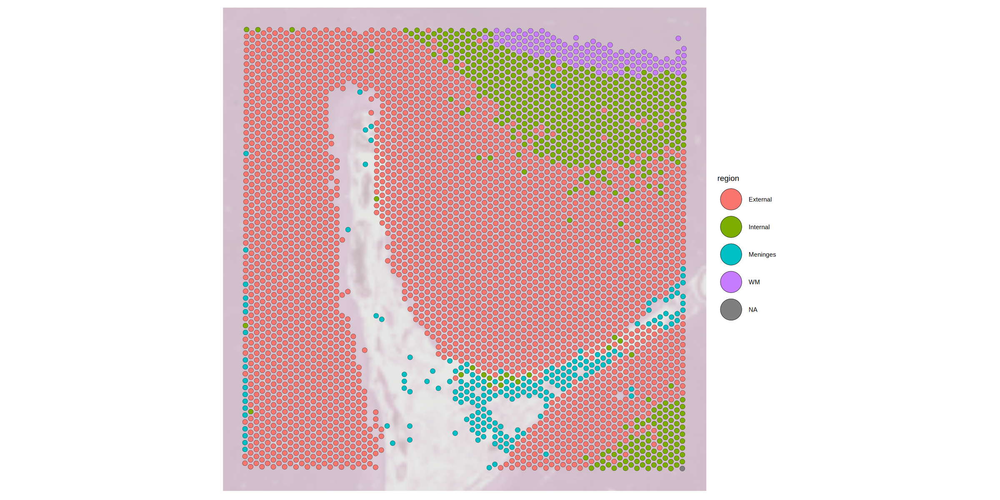

In [95]:
SpatialPlot(s13, group.by = "region", pt.size.factor = 3, image.alpha = 0.3) + guides(fill = guide_legend(override.aes = list(size=14)))

In [53]:
df %>% filter(gene %in% c("PDGFRA"), p_val_adj < 0.05)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>


In [96]:
s13 <- subset(s13, region %in% c("Internal", "External"))

Warning message:
“Removing 1 cells missing data for vars requested”
Warning message:
“Not validating Seurat objects”


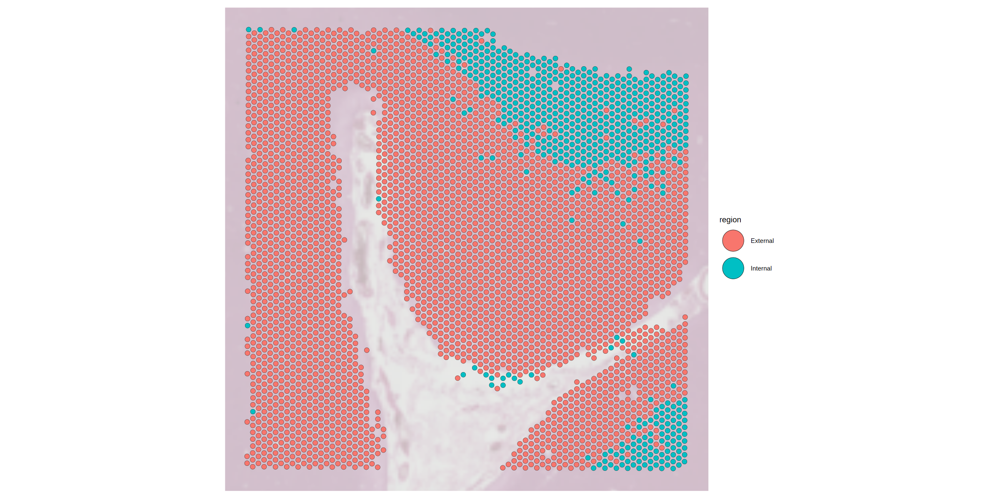

In [97]:
SpatialPlot(s13, group.by = "region", pt.size.factor = 3, image.alpha = 0.3) + guides(fill = guide_legend(override.aes = list(size=14)))

## Transfer labels

In [76]:
anchors <- FindTransferAnchors(reference = atlas, query = s13, normalization.method = "SCT", k.anchor = 10)
qsave(anchors, file = "~/projects_link/ST_micro/c2l_res/nAD/anchors.qs")

Normalizing query using reference SCT model

Warning message:
“No layers found matching search pattern provided”
Performing PCA on the provided reference using 2683 features as input.

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 321 anchors



In [6]:
anchors <- qread("~/projects_link/ST_micro/c2l_res/nAD/anchors.qs")

In [7]:
s13 <- SCTransform(s13, assay = "Spatial", verbose = FALSE)
s13 <- RunPCA(s13, assay = "SCT", verbose = FALSE)

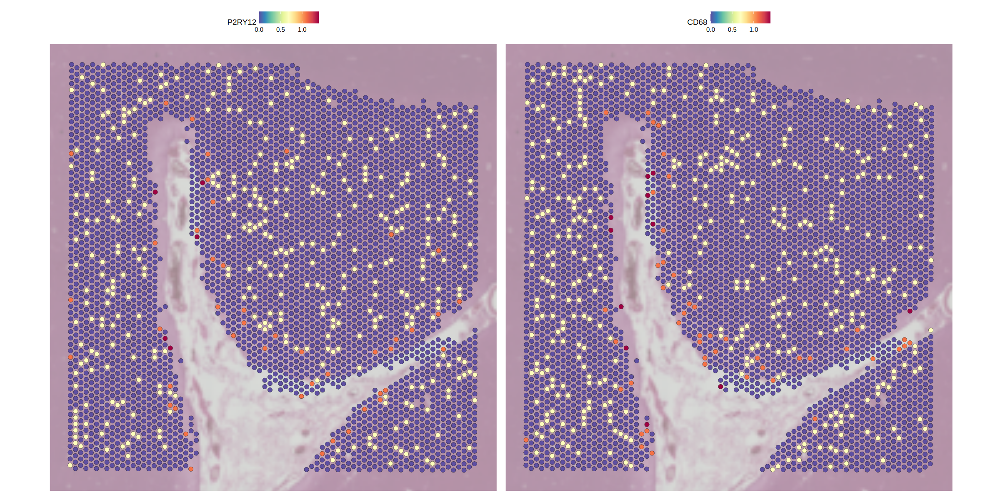

In [8]:
SpatialFeaturePlot(s13, features = c("P2RY12", "CD68"), image.alpha = 0.5, pt.size.factor = 3)

In [9]:
s13$spatial_cluster <- as.integer(as.factor(s13$spatial_cluster))
s13$spatial_cluster <- factor(s13$spatial_cluster, levels = as.character(sort(unique(s13$spatial_cluster))))

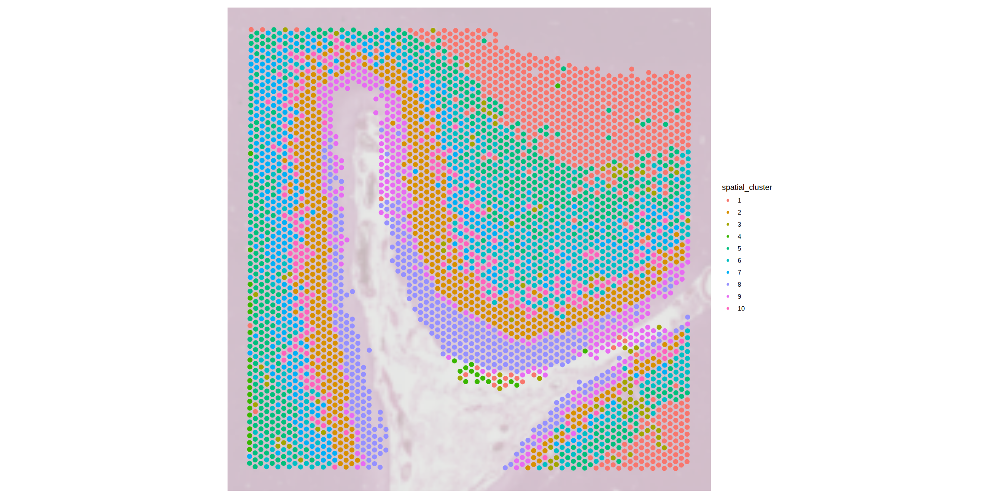

In [10]:
#s13$spatial_cluster <- factor(s13$spatial_cluster, levels = as.character(0:11))
SpatialPlot(s13, group.by = "spatial_cluster", image.alpha = 0.3, pt.size.factor = 3, stroke = NA)
ggsave("results/nAD/GSM8184313/final_clustering.pdf", width = 6, height = 5)

In [11]:
Idents(s13) <- "spatial_cluster"

In [12]:
predictions.assay <- TransferData(anchorset = anchors, refdata = atlas$Integrated_cell_type, prediction.assay = TRUE, weight.reduction = s13[["pca"]], dims = 1:15)
s13[["predictions"]] <- predictions.assay

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [13]:
Idents(s13) <- "region"
score_data <- as.data.frame(t(s13@assays$predictions@data))
score_data$barcode <- rownames(score_data)

In [14]:
colnames(score_data)

[1] "MHCII"                 "Inflammatory-III"      "Stress-Signature"     
 [4] "Neuronal-Surveillance" "Homeostatic"           "Inflammatory-II"      
 [7] "IFN"                   "Activated"             "Inflammatory-I"       
[10] "Mic-reduced"           "Lipid-Processing"      "Cycling"              
[13] "max"                   "barcode"

In [15]:
tmp <- s13@meta.data[, c("orig.ident", "region")]
tmp$barcode <- rownames(tmp)

if (all(rownames(score_data) == colnames(s13))) {
    data1 <- merge(x = tmp, y = score_data, by = "barcode")
}

In [16]:
atlas$Integrated_cell_type <- gsub("-", "_", atlas$Integrated_cell_type)

In [17]:
unique(atlas$Integrated_cell_type)

[1] "MHCII"                 "Inflammatory_III"      "Stress_Signature"     
 [4] "Neuronal_Surveillance" "Homeostatic"           "Inflammatory_II"      
 [7] "IFN"                   "Activated"             "Inflammatory_I"       
[10] "Mic_reduced"           "Lipid_Processing"      "Cycling"

In [18]:
colnames(data1)

[1] "barcode"               "orig.ident"            "region"               
 [4] "MHCII"                 "Inflammatory-III"      "Stress-Signature"     
 [7] "Neuronal-Surveillance" "Homeostatic"           "Inflammatory-II"      
[10] "IFN"                   "Activated"             "Inflammatory-I"       
[13] "Mic-reduced"           "Lipid-Processing"      "Cycling"              
[16] "max"

In [19]:
colnames(data1) <- gsub("-", "_", colnames(data1))
cell_states <- colnames(data1)[colnames(data1) %in% atlas$Integrated_cell_type]
cell_states

[1] "MHCII"                 "Inflammatory_III"      "Stress_Signature"     
 [4] "Neuronal_Surveillance" "Homeostatic"           "Inflammatory_II"      
 [7] "IFN"                   "Activated"             "Inflammatory_I"       
[10] "Mic_reduced"           "Lipid_Processing"      "Cycling"

In [46]:
data1 %>%
    mutate(across(all_of(cell_states), ~ .x > quantile(.x, 0.75), .names = "{.col}_state")) %>%
    select(barcode, orig.ident, region, ends_with("_state")) -> meta_states

In [70]:
meta_states %>%
    select(barcode, Homeostatic_state, Activated_state) %>%
    pivot_longer(cols = ends_with("state"), names_to = "state", values_to = "value") %>%
    group_by(barcode) %>%
    mutate(n = sum(value)) %>%
    arrange(desc(n)) -> a 

sum(a$n == 0)

[1] 5500

In [52]:
s13@meta.data <- bind_cols(s13@meta.data, meta_states %>% select(Homeostatic_state, Activated_state))

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


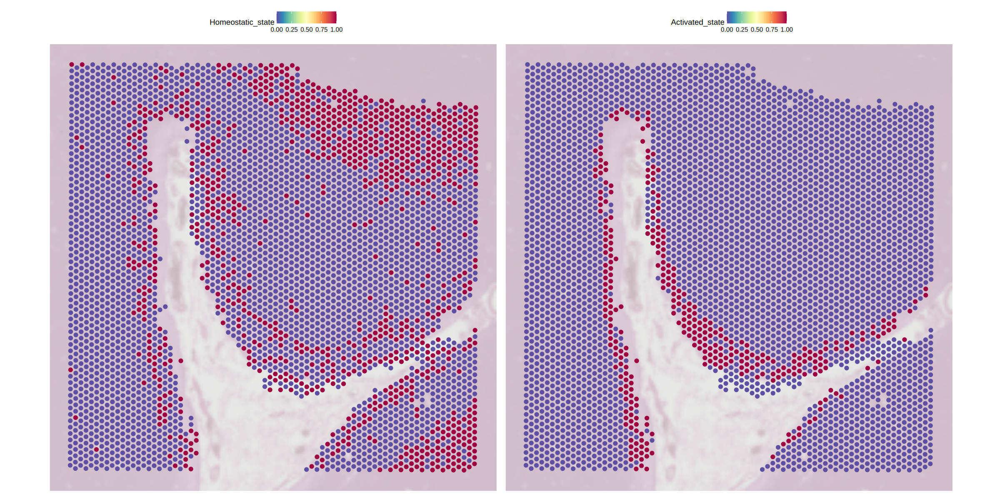

In [155]:
SpatialPlot(s13, features = c("Homeostatic_state", "Activated_state"), image.alpha = 0.3, pt.size.factor = 3, cols = c("TRUE" = "red", "FALSE" = "blue"), stroke = NA)
ggsave("c2l_res/nAD/fig3.pdf", width = 12, height = 7)

In [73]:
data1 %>%
    mutate(across(all_of(cell_states), ~ .x > quantile(.x, 0.75), .names = "{.col}_state")) %>%
    select(barcode, orig.ident, region, ends_with("_state")) %>%
    pivot_longer(cols = ends_with("state"), names_to = "state", values_to = "value") %>%
    filter(state == "Activated_state") %>%
    group_by(region) %>%
    mutate(total_region = n()) %>%
    ungroup() %>%
    group_by(region, state) %>%
    mutate(total_group = sum(value)) -> activated_table

In [79]:
t_activated <- table(activated_table$region, activated_table$value)

In [80]:
fisher.test(t_activated)


	Fisher's Exact Test for Count Data

data:  t_activated
p-value < 2.2e-16
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 0.00000000 0.05140669
sample estimates:
odds ratio 
         0 


In [76]:
data1 %>%
    mutate(across(all_of(cell_states), ~ .x > quantile(.x, 0.75), .names = "{.col}_state")) %>%
    select(barcode, orig.ident, region, ends_with("_state")) %>%
    pivot_longer(cols = ends_with("state"), names_to = "state", values_to = "value") %>%
    filter(state == "Homeostatic_state") %>%
    group_by(region) %>%
    mutate(total_region = n()) %>%
    ungroup() %>%
    group_by(region, state) %>%
    mutate(total_group = sum(value)) -> homeostatic_table

In [81]:
t_homeostatic <- table(homeostatic_table$region, homeostatic_table$value)

In [82]:
fisher.test(t_homeostatic)


	Fisher's Exact Test for Count Data

data:  t_homeostatic
p-value < 2.2e-16
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
  9.920407 14.657770
sample estimates:
odds ratio 
  12.04222 


In [109]:
# This is the total of neuronal spots identified (it does not include WM and meninges)
total_spots <- ncol(s13)

data1 %>%
    mutate(across(all_of(cell_states), ~ .x > quantile(.x, 0.75), .names = "{.col}_state")) %>%
    select(barcode, orig.ident, region, ends_with("_state")) %>%
    pivot_longer(cols = ends_with("state"), names_to = "state", values_to = "value") %>%
    group_by(region) %>%
    mutate(total_region = length(unique(barcode))) %>%
    ungroup() %>%
    group_by(region, state) %>%
    mutate(total_state = sum(value)) %>%
    filter(state %in% c("Activated_state", "Homeostatic_state")) %>%
    select(region, state, total_region, total_state) %>%
    unique() -> plot_state

In [110]:
plot_state <- plot_state %>%
    rename(has_state = total_state) %>%
    mutate(no_state = total_region - has_state,
           prop_state = has_state / total_region,
           prop_no_state = no_state / total_region)

In [127]:
plot_state <- plot_state %>%
  group_by(state) %>%
  mutate(
    p = fisher.test(as.matrix(select(cur_data(), has_state, no_state)))$p.value
  )


In [133]:
plot_state

region,state,total_region,has_state,no_state,prop_state,prop_no_state,p
<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
External,Homeostatic_state,3323,536,2787,0.16130003,0.8387000,8.529350e-162
External,Activated_state,3323,330,2993,0.09930785,0.9006921,1.174946e-27
Internal,Homeostatic_state,657,459,198,0.69863014,0.3013699,8.529350e-162
Internal,Activated_state,657,0,657,0.00000000,1.0000000,1.174946e-27


In [134]:
plot_state %>%
    select(-total_region, has_state, no_state) %>%
    pivot_longer(c(prop_state, prop_no_state)) %>%
    mutate(name = ifelse(name == "prop_state", "Yes", "No"))

region,state,has_state,no_state,p,name,value
<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<dbl>
External,Homeostatic_state,536,2787,8.529350e-162,Yes,0.16130003
External,Homeostatic_state,536,2787,8.529350e-162,No,0.83869997
External,Activated_state,330,2993,1.174946e-27,Yes,0.09930785
External,Activated_state,330,2993,1.174946e-27,No,0.90069215
Internal,Homeostatic_state,459,198,8.529350e-162,Yes,0.69863014
Internal,Homeostatic_state,459,198,8.529350e-162,No,0.30136986
Internal,Activated_state,0,657,1.174946e-27,Yes,0.00000000
Internal,Activated_state,0,657,1.174946e-27,No,1.00000000


region,state,has_state,prop,p
<chr>,<chr>,<chr>,<dbl>,<dbl>
External,Homeostatic_state,Yes,0.16130003,8.529350e-162
External,Homeostatic_state,No,0.83869997,8.529350e-162
External,Activated_state,Yes,0.09930785,1.174946e-27
External,Activated_state,No,0.90069215,1.174946e-27
Internal,Homeostatic_state,Yes,0.69863014,8.529350e-162
Internal,Homeostatic_state,No,0.30136986,8.529350e-162
Internal,Activated_state,Yes,0.00000000,1.174946e-27
Internal,Activated_state,No,1.00000000,1.174946e-27


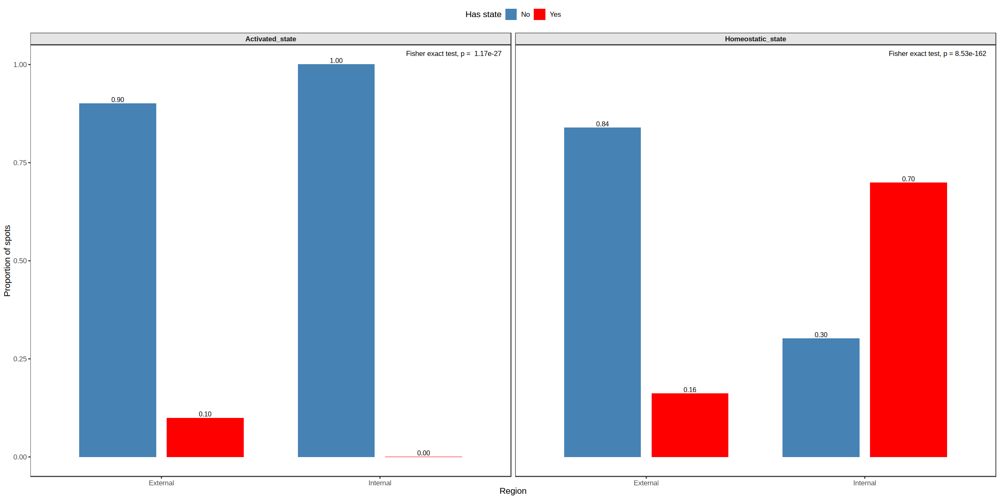

In [154]:
fisher_df <- plot_state %>%
  group_by(state) %>%
  summarise(
    p = fisher.test(matrix(c(has_state, no_state), ncol = 2))$p.value
  )

plot_df <- plot_state %>%
  select(region, state, prop_state, prop_no_state) %>%
  pivot_longer(c(prop_state, prop_no_state),
               names_to = "has_state", values_to = "prop") %>%
  mutate(has_state = ifelse(has_state == "prop_state", "Yes", "No")) %>%
  left_join(fisher_df, by = "state")

plot_df

ggplot(plot_df,
       aes(x = region, y = prop, fill = has_state)) +
        geom_col(position = position_dodge(width = 0.8), width = 0.7) +
  geom_text(aes(label = sprintf("%.2f", prop)),
            position = position_dodge(width = 0.8),
            vjust = -0.3, size = 3.2) +
  facet_wrap(~ state, nrow = 1) +
  geom_text(
    data = dplyr::distinct(plot_df, state, p),
    aes(
      x = Inf, y = Inf,
      label = paste0("Fisher exact test, p = ", format(p, scientific = TRUE, digits = 3))
    ),
    hjust = 1.1, vjust = 2.2, size = 3.4, inherit.aes = F
  ) +
  scale_fill_manual(values = c("Yes" = "red", "No" = "steelblue")) +
  labs(x = "Region",
       y = "Proportion of spots",
       fill = "Has state") +
  theme_bw(base_size = 12) +
  theme(
    panel.grid = element_blank(),
    strip.background = element_rect(fill = "gray90"),
    strip.text = element_text(face = "bold"),
    legend.position = "top"
  )
ggsave("c2l_res/nAD/prop_transfer.pdf", width = 5, height = 4)

Warning message:
“Width not defined
ℹ Set with `position_dodge(width = ...)`”


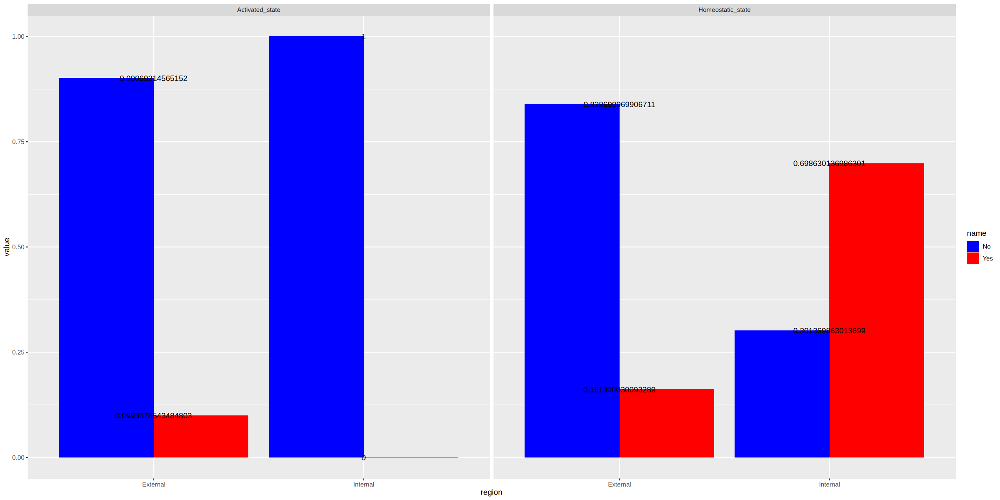

In [140]:
plot_state %>%
    select(-total_region, has_state, no_state) %>%
    pivot_longer(c(prop_state, prop_no_state)) %>%
    mutate(name = ifelse(name == "prop_state", "Yes", "No")) %>%
    ggplot(aes(x = region, y = value, fill = name)) +
        geom_bar(stat = "identity", position = "dodge") +
        geom_text(aes(label = value), position = "dodge") +
        facet_wrap(~state) + 
        scale_fill_manual(values = c("Yes" = "red", "No" = "blue"))

In [16]:
homeostatic <- c("P2RY12", "P2RY13", "CX3CR1")
activated <- c("SPP1", "CD9", "TREM2")

In [17]:
s13 <- AddModuleScore(
  object = s13,
  features = list(homeostatic_sig = homeostatic, activated_sig = activated)
)

In [18]:
colnames(s13@meta.data)

[1] "orig.ident"                  "nCount_Spatial"             
 [3] "nFeature_Spatial"            "_index"                     
 [5] "in_tissue"                   "array_row"                  
 [7] "array_col"                   "n_genes_by_counts"          
 [9] "log1p_n_genes_by_counts"     "total_counts"               
[11] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[13] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[15] "pct_counts_in_top_500_genes" "n_counts"                   
[17] "n_genes"                     "sample"                     
[19] "_indices"                    "_scvi_batch"                
[21] "_scvi_labels"                "Astro"                      
[23] "Chandelier"                  "Endo"                       
[25] "L2/3 IT"                     "L4 IT"                      
[27] "L5 ET"                       "L5 IT"                      
[29] "L5/6 NP"                     "L6 CT"                      
[31] "L6 IT"                       "L6 IT Car3"                 
[33] "L6b"                         "Lamp5"                      
[35] "Lamp5_Lhx6"                  "Micro-PVM"                  
[37] "OPC"                         "Oligo"                      
[39] "Pax6"                        "Pvalb"                      
[41] "Sncg"                        "Sst"                        
[43] "Sst Chodl"                   "VLMC"                       
[45] "Vip"                         "total_cells"                
[47] "total_neurons"               "neuron_rich"                
[49] "neuron_rich_str"             "spatial_cluster"            
[51] "region"                      "nCount_SCT"                 
[53] "nFeature_SCT"                "Cluster1"                   
[55] "Cluster2"

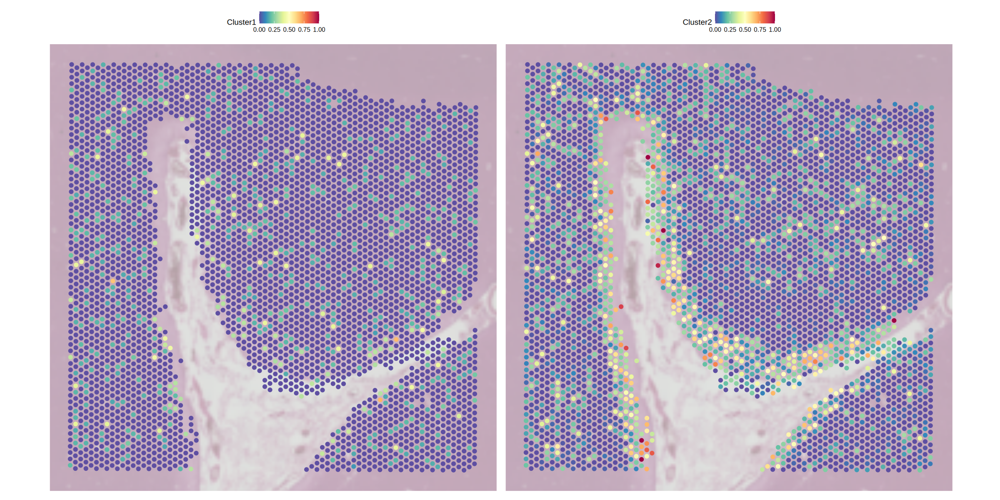

In [19]:
SpatialFeaturePlot(s13, features = c("Cluster1", "Cluster2"), pt.size.factor = 3, image.alpha = 0.4, min.cutoff = 0, max.cutoff = 1, keep.scale = "all", stroke = NA)
ggsave(file = "c2l_res/nAD/fig2_gene_score_mic_states.pdf", width = 12, height = 7)

In [ ]:
## Plot figures

In [2]:
s13_p <- readRDS("~/projects_link/ST_micro/c2l_res/nAD/GSM8184313_only_neurons.rds")
img <- Read10X_Image("data/ST_AN1792_GSE263034/GSM8184313/spatial/", image.name = "tissue_hires_image.png")
DefaultAssay(img) <- "Spatial"
common <- intersect(colnames(s13_p), rownames(img@coordinates))
s13_p <- s13_p[, common]
img <- img[common, ]
s13_p[["GSM8184313"]] <- img

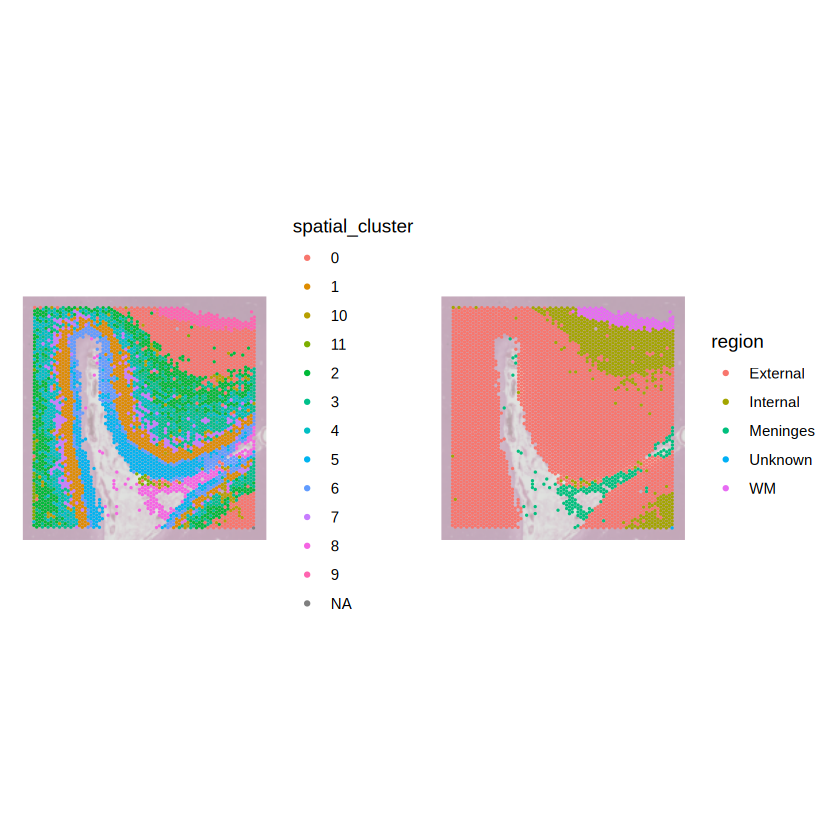

In [3]:
SpatialPlot(s13_p, group.by = c("spatial_cluster", "region"), pt.size.factor = 3, image.alpha = 0.4, stroke = NA)
#ggsave(file = "c2l_res/nAD/fig1_clusters_layers.pdf", width = 12, height = 7)

In [4]:
colnames(s13_p@meta.data)

[1] "orig.ident"                  "nCount_Spatial"             
 [3] "nFeature_Spatial"            "_index"                     
 [5] "in_tissue"                   "array_row"                  
 [7] "array_col"                   "n_genes_by_counts"          
 [9] "log1p_n_genes_by_counts"     "total_counts"               
[11] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[13] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[15] "pct_counts_in_top_500_genes" "n_counts"                   
[17] "n_genes"                     "sample"                     
[19] "_indices"                    "_scvi_batch"                
[21] "_scvi_labels"                "Astro"                      
[23] "Chandelier"                  "Endo"                       
[25] "L2/3 IT"                     "L4 IT"                      
[27] "L5 ET"                       "L5 IT"                      
[29] "L5/6 NP"                     "L6 CT"                      
[31] "L6 IT"                       "L6 IT Car3"                 
[33] "L6b"                         "Lamp5"                      
[35] "Lamp5_Lhx6"                  "Micro-PVM"                  
[37] "OPC"                         "Oligo"                      
[39] "Pax6"                        "Pvalb"                      
[41] "Sncg"                        "Sst"                        
[43] "Sst Chodl"                   "VLMC"                       
[45] "Vip"                         "total_cells"                
[47] "total_neurons"               "neuron_rich"                
[49] "neuron_rich_str"             "spatial_cluster"            
[51] "region"

In [5]:
s13_p <- subset(s13_p, spatial_cluster %in% NA, invert = T)

Warning message:
“Removing 1 cells missing data for vars requested”


In [6]:
s13_p <- SCTransform(s13_p, assay = "Spatial", verbose = FALSE)

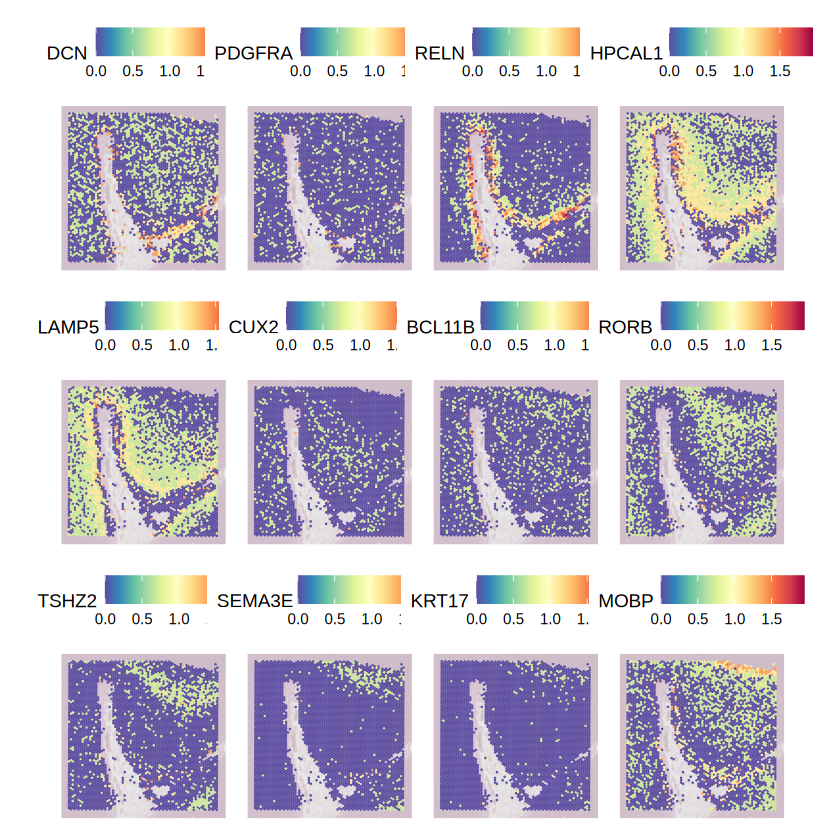

In [10]:
markers = list(
    "meningeal" = c('DCN', 'PDGFRA'),
    "L1" = c('RELN'),
    "L2" = c('HPCAL1', 'LAMP5'),
    "L3" = c('CUX2', 'BCL11B'),
    "L4" = c('RORB', 'TSHZ2'),
    "L5/6" = c('SEMA3E', 'KRT17'),
    "white" = c('MOBP')
)
SpatialFeaturePlot(s13_p, features = unlist(markers), image.alpha = 0.3, pt.size.factor = 3, stroke = NA, keep.scale = "all")
ggsave("c2l_res/nAD/layer_markers.pdf", width = 10, height = 10, dpi = 300)